In [1]:
library(plotly)

Loading required package: ggplot2


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout




## Synthesize Data

In [2]:
# feature vector (single feature plus phi_0)
X = cbind(1, seq(-1,1,length = 1000))

In [3]:
# parameter ground truth (w0, w1) in matrix form
W = t(t(c(30,4.5)))

In [4]:
# generate ground truth labels and add gaussian noise
Y = X%*%W + rnorm(nrow(X), mean = 0, sd = 0.5)

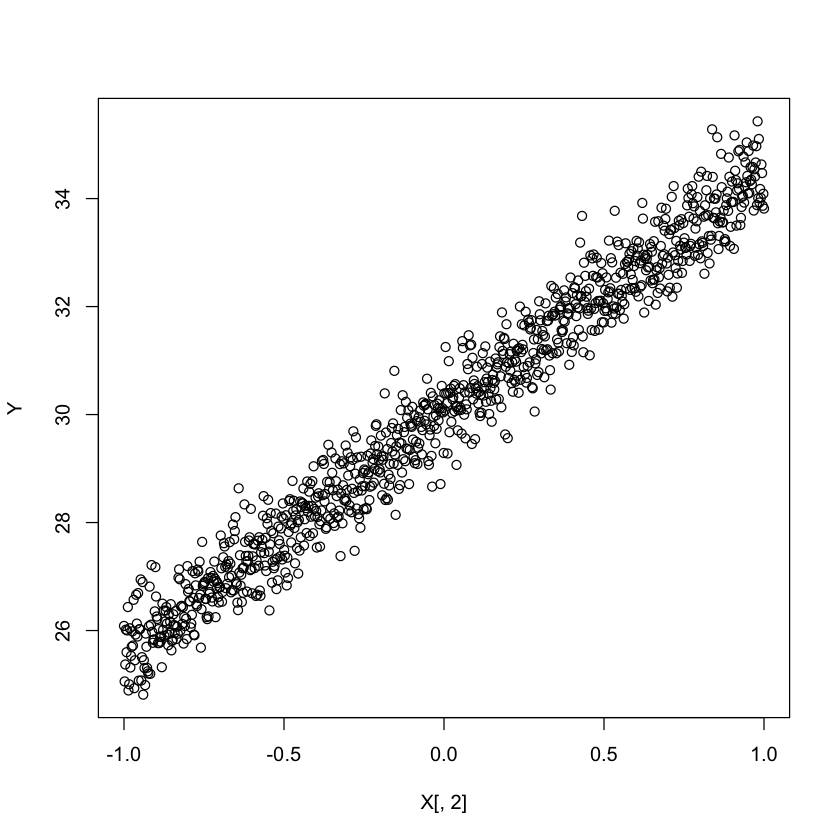

In [5]:
plot(X[,2],Y)

## Solving using Closed Form
Solving using the closed form solution for the least squares given by:

$$\hat W= (X^T X)^{-1} X^T Y$$

In [6]:
W_Hat = solve(t(X)%*%X)%*%t(X)%*%Y

In [7]:
W_Hat

30.022724
4.453163


## Plotting the Loss Surface

In [8]:
# define function to calculate loss using X,Y and a given arbitrary parameter vector
loss <- function(w0, w1){
W = t(cbind(w0,w1))
temp = (X%*%W - Y)
0.5 * (t(temp)%*%temp)[1] / nrow(X)
}

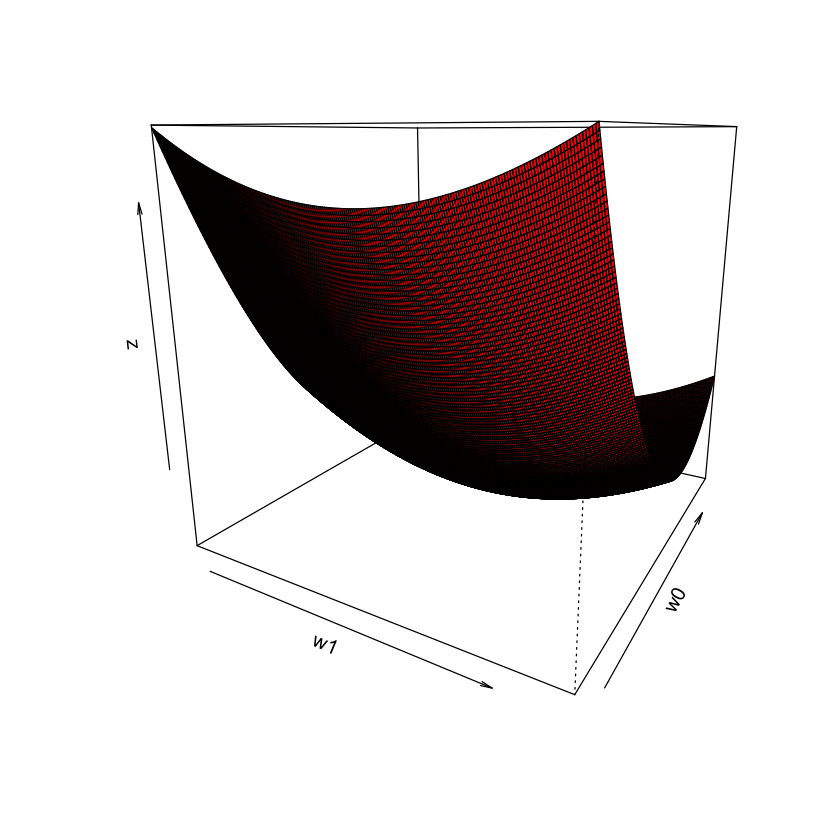

In [9]:
# calculate the loss surface for a parameter space grid
w0 <- w1 <- seq(-60, 70, length= 200)
count = 1
z = matrix(nrow = length(w0), ncol = length(w1))
for (i in 1:length(w0)){
    for (j in 1:length(w1)){
        z[j,i] = loss(w0[i],w1[j])
    }
}
# plot using perspective (non interactive)
persp(w1, w0, z, theta = 30, col = 'red')

In [10]:
# plot using plotly (interactive)
fig <- plot_ly(x = w0, y = w1, z = z) %>% add_surface() %>% layout(
    title = "Loss Surface",
    scene = list(
      xaxis = list(title = "w0", hovertext = 'w0'),
      yaxis = list(title = "w1"),
      zaxis = list(title = "L(W)")
    )) %>%
  add_trace(
    type = 'surface',
    hovertemplate = 'w0: %{x:.2f}</br></br>w1: %{y:.2f}</br>L(W): %{z:.2f}<extra></extra>',
    showlegend = FALSE
  )
fig

HTML widgets cannot be represented in plain text (need html)

## Solving by Gradient Descent

In [11]:
# initialise params and hyper params
W_Hat = matrix(runif(2), nrow = 2, ncol = 1)
eta = 0.0001
epoch = 1000
epsilon = 0.00001
error = c()

We now implement Batch gradient descent using the matrix form of the gradient given by the formula:
$$\Delta L(W) = 2X^TXW - 2X^TY$$

Moreover, for each iteration of gradient descent, we plot the line obtained to visualize convergence. 
The final line upon convergence is plotted in Blue.

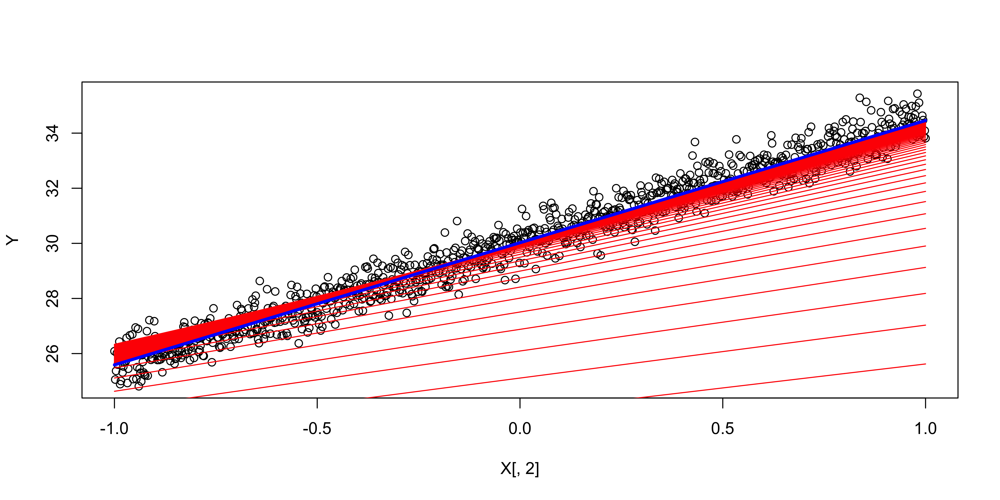

In [12]:
# implement gradient descent (batch mode) using matrix notation
options(repr.plot.width=10, repr.plot.height=5, repr.plot.res=500)
par(mfrow = c(1, 1))
plot(X[,2], Y)
for (k in 1:epoch){
    error[k] <- loss(W_Hat[1], W_Hat[2])
    grad = 2* (t(X)%*%X%*%W_Hat - t(X)%*%Y)
    W_Hat = W_Hat - eta * grad
    lines(X[,2], X%*%W_Hat,col = 'red')
    if (k > 1){
        if (abs(error[k] - error[k-1]) < epsilon){
            lines(X[,2], X%*%W_Hat,col = 'blue',lwd = 3)
            break
        }
    }
}

In [13]:
k

[1] 79

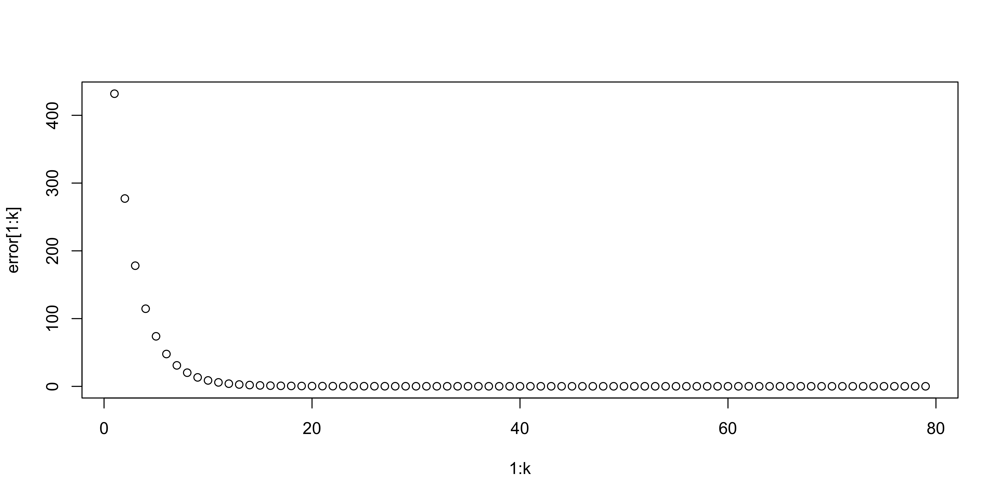

In [14]:
plot(1:k, error[1:k])

In [15]:
W_Hat

30.022723
4.434469


In [16]:
W

30.0
4.5
